Load required tools. 'as' shorthands tools name for convenience.

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import glob
import bbknn

Switching tutorials over to RNA Velocity [scVelo](https://scvelo.readthedocs.io/)

In [2]:
import scvelo as scv
scv.logging.print_version()
sc.logging.print_header()

Running scvelo 0.2.2 (python 3.7.8) on 2020-12-29 14:49.
scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.3 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.2


This verbosity setting is to change your output errors or warning, useful for diagnostics 
* verbosity = 0 shows errors
* verbosity = 1 shows warnings
* verbosity = 2 shows info
* verbosity = 3 shows hints

In [3]:
scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo')

Loading dataset and continuing from previous pipeline

In [4]:
Estrus_subset_analyzed = sc.read('./Estrus_subset_analyzed.h5ad')

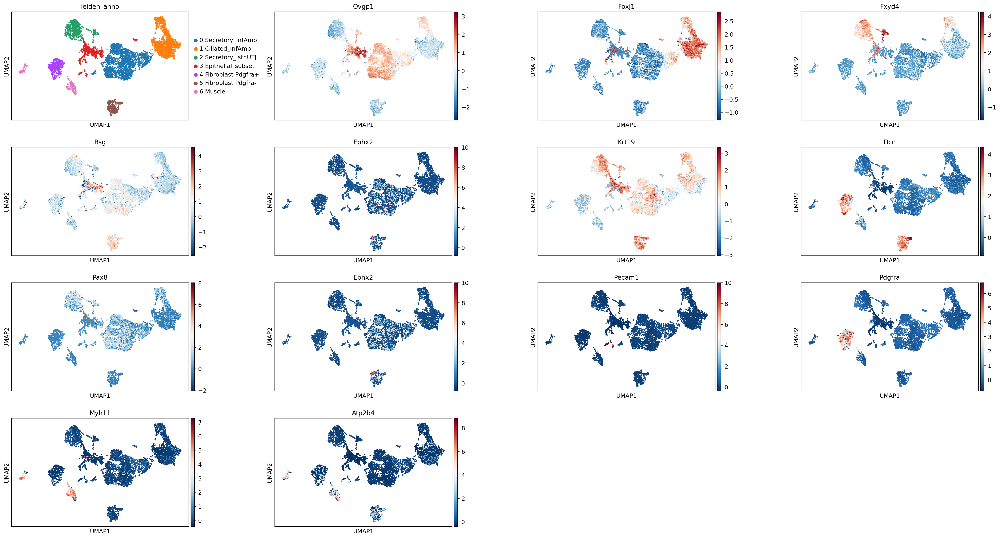

In [5]:
sc.pl.umap(Estrus_subset_analyzed, wspace=0.35, color=['leiden_anno', 'Ovgp1', 'Foxj1', 'Fxyd4', 'Bsg', 'Ephx2', 'Krt19', 'Dcn', 'Pax8', 'Ephx2', 'Pecam1', 'Pdgfra', 'Myh11', 'Atp2b4'])

Creating a copy to keep previous work unedited with further analyzes 

In [6]:
Estrus_subset_analyzed_velo = Estrus_subset_analyzed.copy()

In [7]:
Estrus_subset_analyzed

AnnData object with n_obs × n_vars = 5156 × 17864
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'leiden_anno'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: "dendrogram_['leiden']", 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_anno_colors', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

In [8]:
Estrus_subset_analyzed_velo

AnnData object with n_obs × n_vars = 5156 × 17864
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'leiden_anno'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: "dendrogram_['leiden']", 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_anno_colors', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

* Filtering and normalizing. Filtered genes that are detected less than 30 times in spliced and unspliced layers. n_top_genes is set to maximum to ensure we can plot later in scatter plots.
* Compute moments for velocity estimations PCs and neighbors are 30 by default.

In [9]:
scv.pp.filter_and_normalize(Estrus_subset_analyzed_velo, min_shared_counts=30, n_top_genes=19116)
scv.pp.moments(Estrus_subset_analyzed_velo, n_pcs=30, n_neighbors=30)

Filtered out 8374 genes that are detected 30 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


* Compute velocities for all cells using the stochastic model which exploits not only the balance of of unspliced to spliced mRNA levels but also their covariation.

In [10]:
scv.tl.velocity(Estrus_subset_analyzed_velo)

computing velocities
    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


Computes velocity graph by similarities between velocities and potential cell state transitions

In [11]:
scv.tl.velocity_graph(Estrus_subset_analyzed_velo)

computing velocity graph
    finished (0:00:41) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


Creates an FA plot instead of a UMAP, this a different map that is usually displays the cells slightly better for RNA velocity.

In [12]:
sc.tl.draw_graph(Estrus_subset_analyzed_velo)

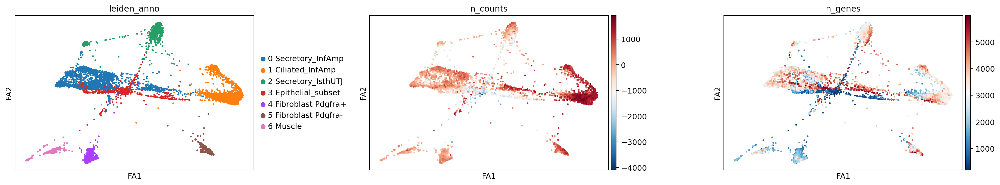

In [13]:
sc.pl.draw_graph(Estrus_subset_analyzed_velo, wspace=0.35,
                 color=['leiden_anno', 'n_counts', 'n_genes'])

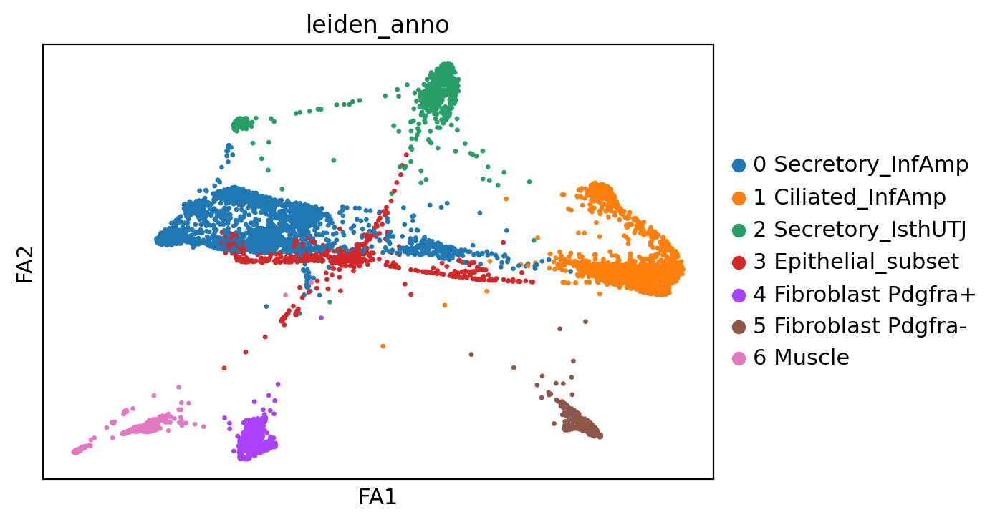

In [14]:
sc.pl.draw_graph(Estrus_subset_analyzed_velo, wspace=0.35,
                 color=['leiden_anno'])

Plotting UMAPs and then go to the previous dataset to check if FA plot did not change the neighboring.

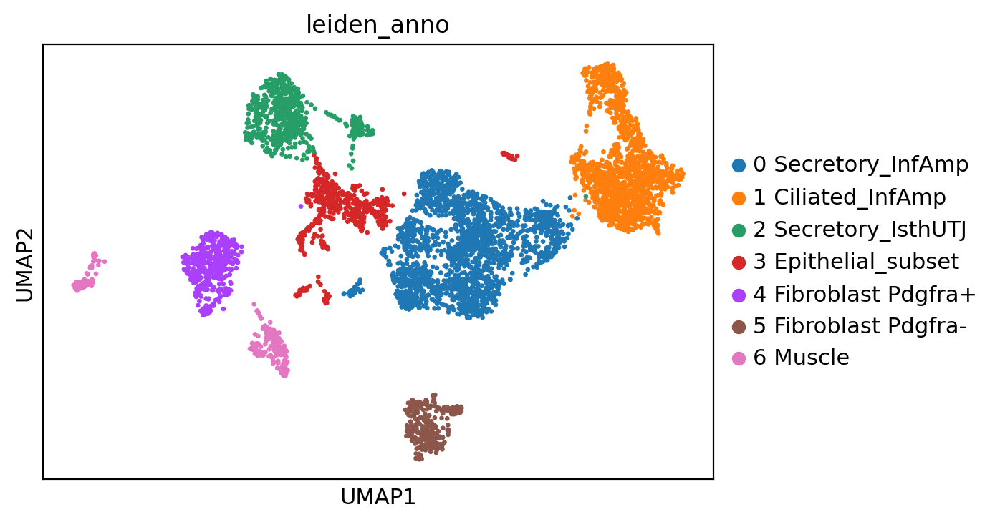

In [15]:
sc.pl.umap(Estrus_subset_analyzed_velo, wspace=0.35,
           color=['leiden_anno'])

Plot velocity vectors on UMAP compared to FA plot, FA plots are better for these vectors.
To choose the type of graph, change at basis='umap' or basis='X_draw_graph_fa'

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


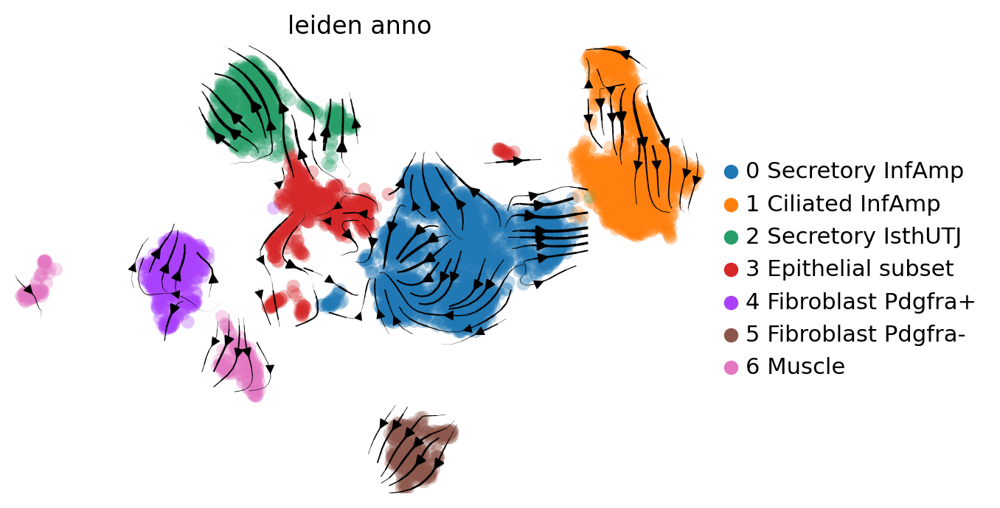

In [16]:
scv.pl.velocity_embedding_stream(Estrus_subset_analyzed_velo, basis='umap', 
                                 color=['leiden_anno'],
                                 frameon=False, legend_loc='right margin')

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


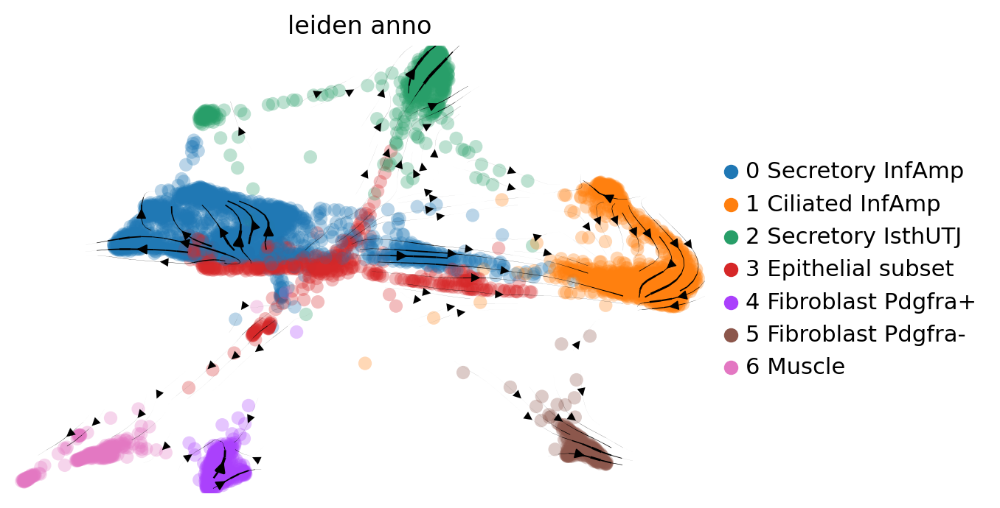

In [17]:
scv.pl.velocity_embedding_stream(Estrus_subset_analyzed_velo, basis='X_draw_graph_fa',
                                 color=['leiden_anno'],
                                 frameon=False, legend_loc='right margin')

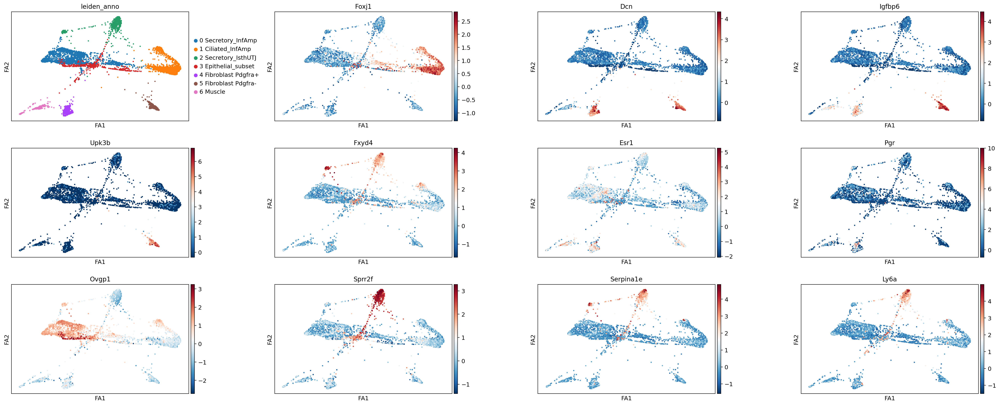

In [18]:
sc.pl.draw_graph(Estrus_subset_analyzed_velo, wspace=0.35,
                 color=['leiden_anno', 'Foxj1', 'Dcn', 'Igfbp6', 'Upk3b',
                        'Fxyd4', 'Esr1', 'Pgr', 'Ovgp1', 'Sprr2f', 'Serpina1e', 'Ly6a'])

In [19]:
Estrus_subset_analyzed_velo

AnnData object with n_obs × n_vars = 5156 × 9490
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'leiden_anno', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: "dendrogram_['leiden']", 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_anno_colors', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'draw_graph'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa', 'velocity_umap', 'velocity_draw_graph_fa'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'connectivities', 'distances'

Compute differential velocity genes, 'resolution' is set to the same from the Seurat pipeline.
'n_genes' is set high to obtain as much as possible of differential velocity genes

In [20]:
scv.tl.rank_velocity_genes(Estrus_subset_analyzed_velo, resolution=0.1, n_genes=5000, 
                           groupby='leiden_anno', match_with='leiden_anno')

ranking velocity genes
    finished (0:00:09) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


* Display differential velocity genes. 'head(5000)' set high to display maximum genes or all
* These are the driver genes for each population (highest driver genes to least driver genes based on p-values)

In [21]:
pd.DataFrame(Estrus_subset_analyzed_velo.uns['rank_velocity_genes']['names']).head(5000)

,0 Secretory_InfAmp,1 Ciliated_InfAmp,2 Secretory_IsthUTJ,3 Epithelial_subset,4 Fibroblast Pdgfra+,5 Fibroblast Pdgfra-,6 Muscle
0,Bmpr1b,Dnah11,Ptprr,Pmvk,Pdzrn3,Tmem108,Cacna2d1
1,Nav2,Esrrg,Hmga2,Ddah1,Mitf,Il1rapl1,Dmd
2,Slc41a2,Dnah7a,Pik3c2a,1700088E04Rik,Lsamp,Cacna1a,Jph2
3,Lgr4,Kif6,Mboat2,Dnajb11,Zeb2,Arhgap10,Itga9
4,Msi2,Ccdc148,Gpr160,Fxyd5,Adk,Frmd4b,Itga1
...,...,...,...,...,...,...,...
1571,Dapk1,Ece1,Pald1,Adig,Myo5c,Rasef,Mob3b
1572,Pdzd2,Esr1,Maml3,Odf2l,Ptk2b,Arhgef38,Ptk2b
1573,Gli2,Utrn,Peli2,Ift81,Lama5,Myo5c,Rasef
1574,Ttc28,Tctex1d2,Stxbp4,Pmepa1,Sorbs2,Stim2,Arhgef38


If needed, create differential velocity genes object to export in .csv file.

In [22]:
Estrus_subset_analyzed_velo_Drivers = pd.DataFrame(Estrus_subset_analyzed_velo.uns['rank_velocity_genes']['names'])

In [23]:
Estrus_subset_analyzed_velo_Drivers.to_csv('./Estrus_subset_analyzed_velo_Drivers.csv')

Create object of dataset variables: useful to see all genes and to see which one are differential or if any genes are missing in your data

In [24]:
Estrus_subset_analyzed_velo_Drivers_variables = Estrus_subset_analyzed_velo.var.copy()

Export to csv Excel
If the genes are not on this list, it will not show up on the scatter plot for the pseudotime lateron.

In [25]:
Estrus_subset_analyzed_velo_Drivers_variables.to_csv('./Estrus_subset_analyzed_velo_Drivers_variables.csv')

Plot unspliced/spliced ratio along with velocity and expression. 
Great to see differential velocity genes.
Genes must be inputed into 'var_names' as an object. 
FA plots best used here as well. 
If you need to change color of the plot: choice are [here](https://matplotlib.org/tutorials/colors/colormaps.html)

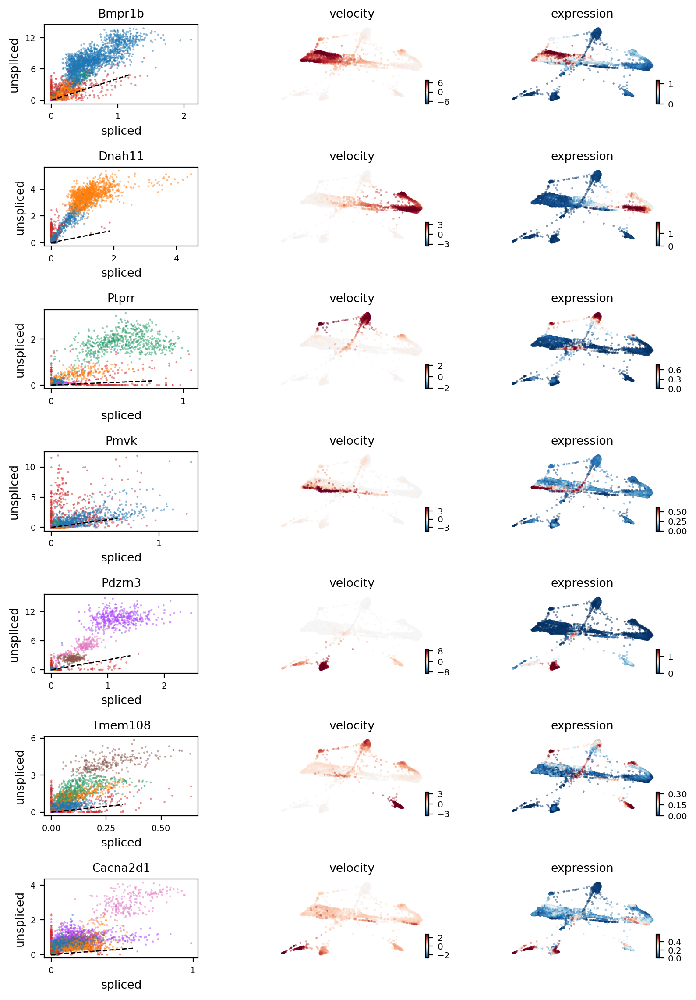

In [26]:
var_names = ['Bmpr1b', 'Dnah11', 'Ptprr', 'Pmvk', 'Pdzrn3', 'Tmem108', 'Cacna2d1']
scv.pl.velocity(Estrus_subset_analyzed_velo, basis='X_draw_graph_fa', var_names=var_names, 
                color='leiden_anno', colorbar=True, color_map='RdBu_r')

the lines represent that there are some velocities between those cells - but doesn't tell which direction. 

saving figure to file ./figures/scvelo__velocitygraph_leidenEstrus_subset_analyzed_velo.pdf


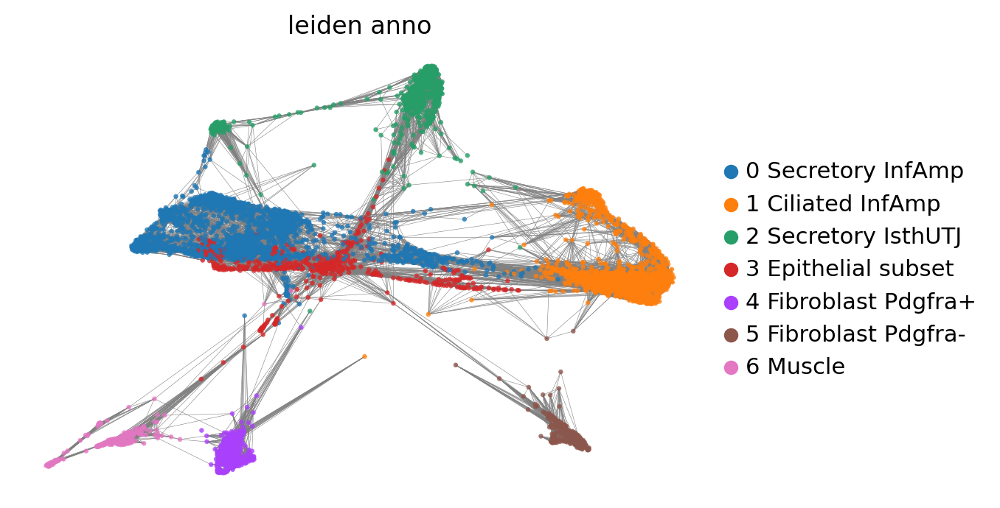

In [27]:
scv.pl.velocity_graph(Estrus_subset_analyzed_velo, basis='X_draw_graph_fa',
                     color='leiden_anno', legend_loc='right margin', 
                     save='_velocitygraph_leidenEstrus_subset_analyzed_velo.pdf')

In [28]:
Estrus_subset_analyzed_velo.write('./Estrus_subset_analyzed_velo.h5ad')

In [29]:
Estrus_subset_analyzed_velo

AnnData object with n_obs × n_vars = 5156 × 9490
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'leiden_anno', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score'
    uns: "dendrogram_['leiden']", 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_anno_colors', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'draw_graph', 'rank_velocity_genes'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa', 'velocity_umap', 'velocity_draw_graph_fa'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'connectivities', 'distances'

In [30]:
%time Estrus_subset_analyzed_velo_dynamics = scv.tl.recover_dynamics(Estrus_subset_analyzed_velo, copy=True)

recovering dynamics
    finished (0:29:09) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
CPU times: user 29min 8s, sys: 1.08 s, total: 29min 9s
Wall time: 29min 9s


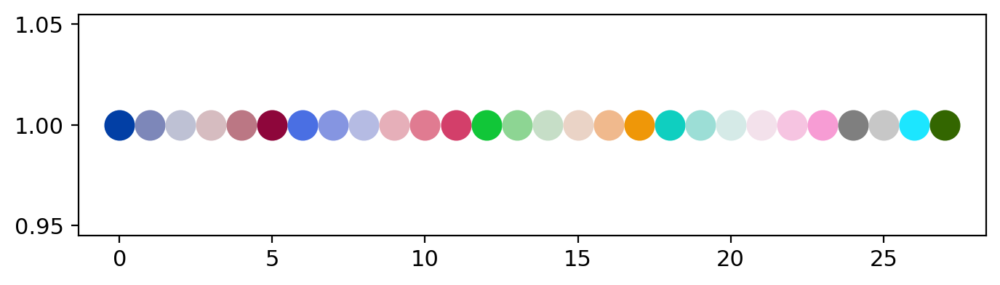

In [31]:
plt.figure(figsize=(8, 2))
for i in range(28):
    plt.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
plt.show()

In [32]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(Estrus_subset_analyzed_velo_dynamics.uns['leiden_anno_colors'])

In [33]:
new_colors[[0]] = zeileis_colors[[6]]  #0 Secretory_InfAmp
new_colors[[1]] = zeileis_colors[[23]]  #1 Ciliated_InfAmp
new_colors[[2]] = zeileis_colors[[13]]  #2 Secretory_IsthUTJ
new_colors[[3]] = zeileis_colors[[5]]  #3 Epithelial_subset
new_colors[[4]] = zeileis_colors[[16]]  #4 Fibroblast Pdgfra+
new_colors[[5]] = zeileis_colors[[17]]  #5 Fibroblast Pdgfra-
new_colors[[6]] = zeileis_colors[[24]]  #6 Muscle

In [34]:
Estrus_subset_analyzed_velo_dynamics.uns['leiden_anno_colors'] = new_colors

In [35]:
scv.tl.velocity(Estrus_subset_analyzed_velo_dynamics, mode='dynamical')
scv.tl.velocity_graph(Estrus_subset_analyzed_velo_dynamics)

computing velocities
    finished (0:00:09) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:17) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


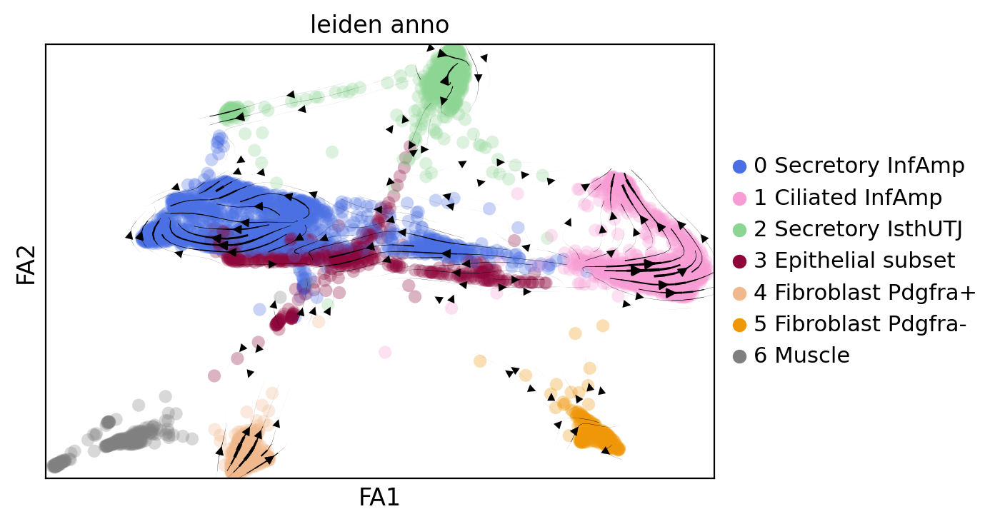

In [36]:
scv.pl.velocity_embedding_stream(Estrus_subset_analyzed_velo_dynamics, basis='X_draw_graph_fa',
                                 color=['leiden_anno'], 
                                 frameon=True, legend_loc='right margin')

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


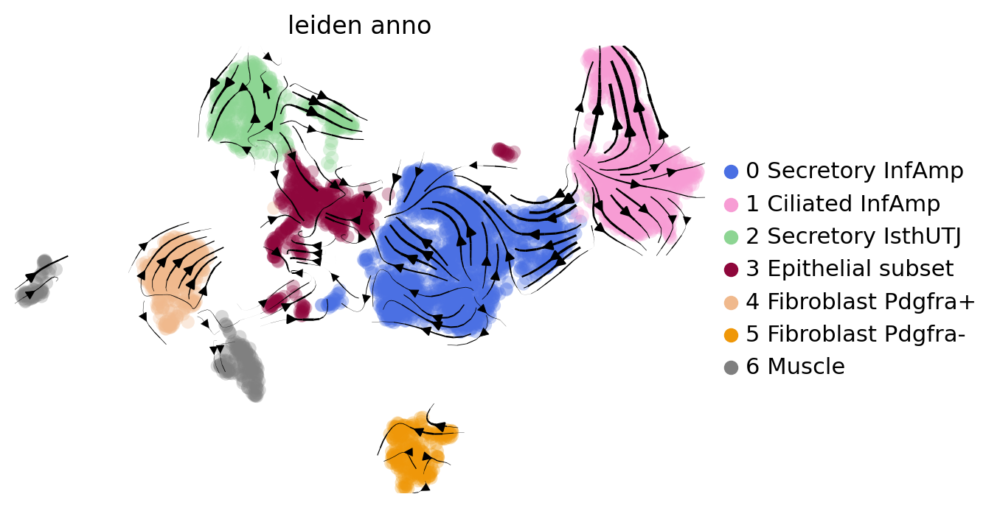

In [37]:
scv.pl.velocity_embedding_stream(Estrus_subset_analyzed_velo_dynamics, basis='umap',
                                 color=['leiden_anno'],
                                 frameon=False, legend_loc='right margin')

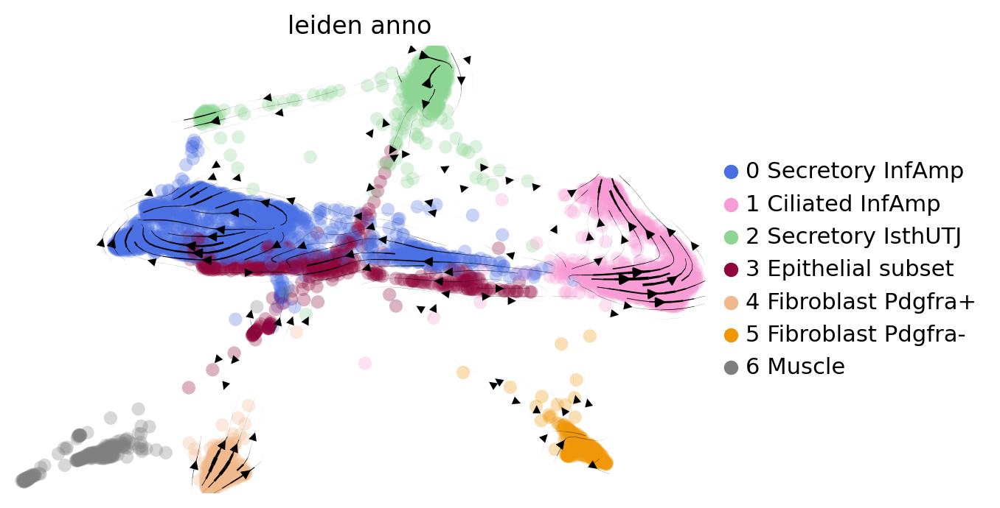

In [38]:
scv.pl.velocity_embedding_stream(Estrus_subset_analyzed_velo_dynamics, basis='X_draw_graph_fa',
                                 color=['leiden_anno'],
                                 frameon=False, legend_loc='right margin')

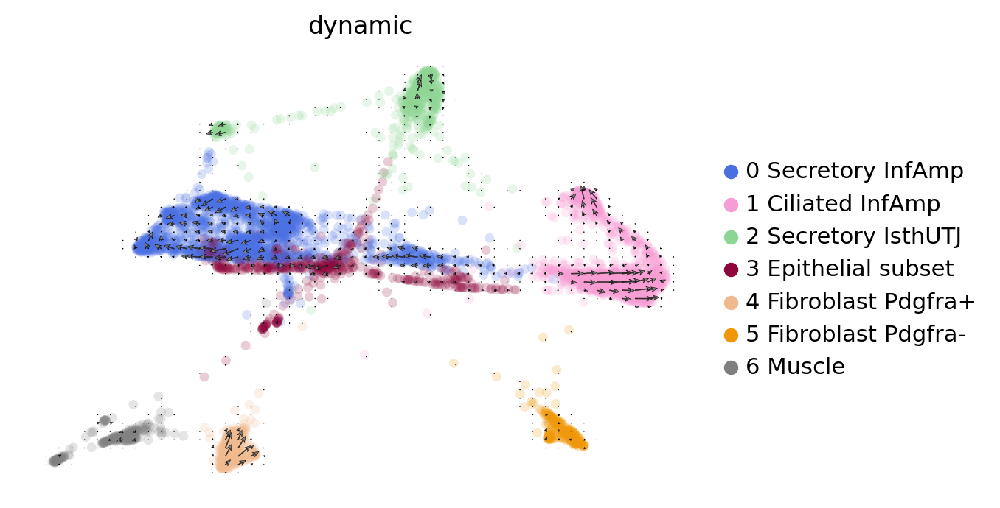

In [39]:
scv.pl.velocity_embedding_grid(Estrus_subset_analyzed_velo_dynamics, legend_loc='right margin', 
                               color='leiden_anno', basis='X_draw_graph_fa',
                               layer=['velocity'], arrow_size=1.5, title='dynamic')

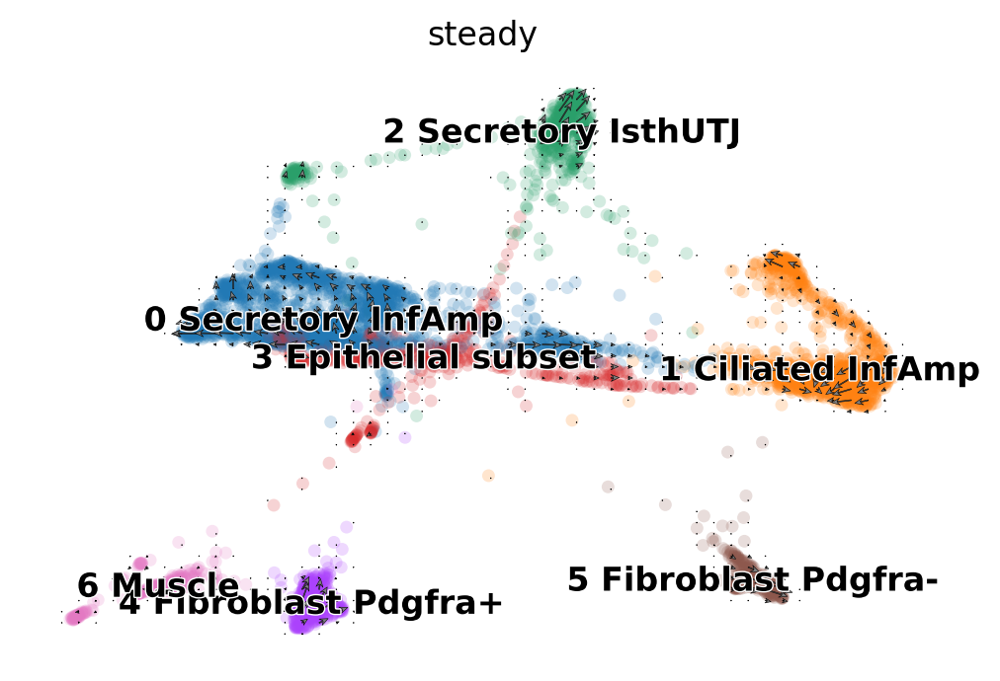

In [40]:
scv.pl.velocity_embedding_grid(Estrus_subset_analyzed_velo, legend_loc='on data',
                               color='leiden_anno', basis='X_draw_graph_fa',
                               layer=['velocity'], arrow_size=1.5, title='steady')

In [41]:
Estrus_subset_analyzed_velo_dynamics_var = Estrus_subset_analyzed_velo_dynamics.var.copy()

In [42]:
scv.tl.recover_latent_time(Estrus_subset_analyzed_velo_dynamics)

computing terminal states
    identified 3 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:02) --> added 
    'latent_time', shared time (adata.obs)


In [43]:
Estrus_subset_analyzed_velo_dynamics.write('./Estrus_subset_analyzed_velo_dynamics.h5ad')

original color_map='gnuplot' can be 'PRGn_r' or 'PiYG'

saving figure to file ./figures/scvelo__Estrus_subset_analyzed_velo_dynamics_Leiden_latent_time.pdf


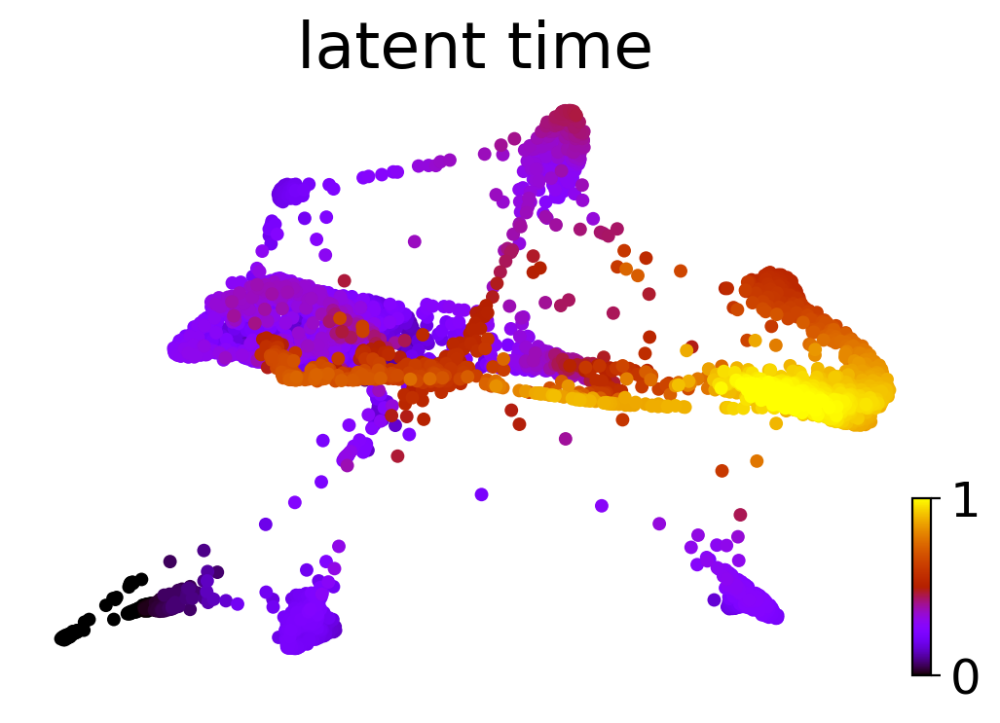

In [45]:
scv.pl.scatter(Estrus_subset_analyzed_velo_dynamics, color='latent_time', 
               fontsize=24, size=100, basis='X_draw_graph_fa', color_map='gnuplot', 
               perc=[2, 98], colorbar=True, rescale_color=[0,1],
            save='_Estrus_subset_analyzed_velo_dynamics_Leiden_latent_time.pdf')

saving figure to file ./figures/scvelo__Fig 5B_Estrus_subset_analyzed_velo_dynamics_VelocityPlot_FA_Igf1.pdf


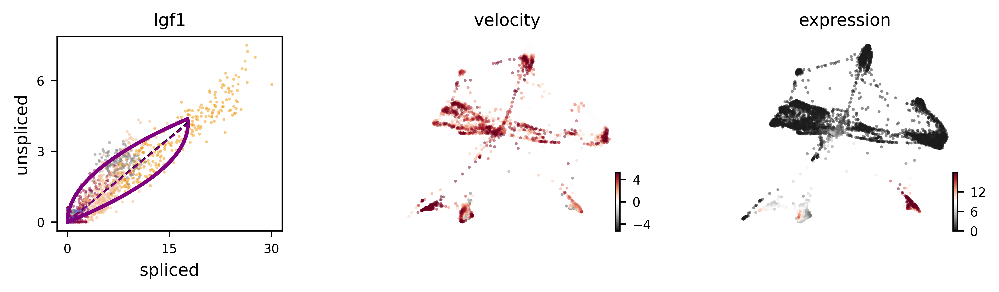

In [46]:
var_names0 = ['Igf1']
scv.pl.velocity(Estrus_subset_analyzed_velo_dynamics, color='leiden_anno', basis='X_draw_graph_fa', dpi=300,
                var_names=var_names0, colorbar=True, color_map='RdGy_r',
               save='_Fig 5B_Estrus_subset_analyzed_velo_dynamics_VelocityPlot_FA_Igf1.pdf')

saving figure to file ./figures/scvelo__Fig 5_Estrus_subset_analyzed_velo_dynamics_VelocityPlot_FA_C3.pdf


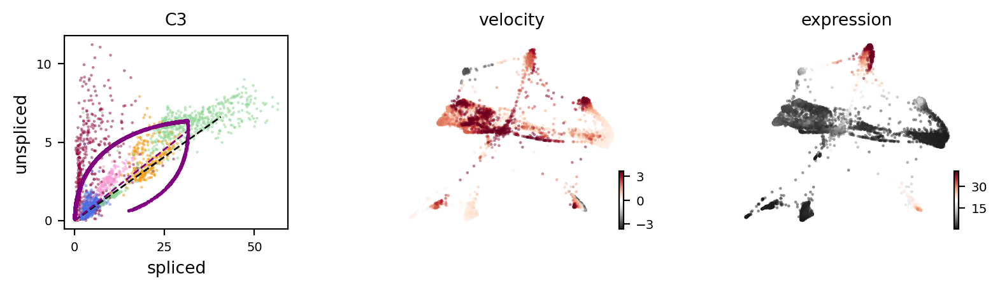

In [47]:
var_names0 = ['C3']
scv.pl.velocity(Estrus_subset_analyzed_velo_dynamics, color='leiden_anno', basis='X_draw_graph_fa', 
                var_names=var_names0, colorbar=True, color_map='RdGy_r',
               save='_Fig 5_Estrus_subset_analyzed_velo_dynamics_VelocityPlot_FA_C3.pdf')

saving figure to file ./figures/scvelo__Fig 5_Estrus_subset_analyzed_velo_dynamics_VelocityPlot_FA_Fgf1.pdf


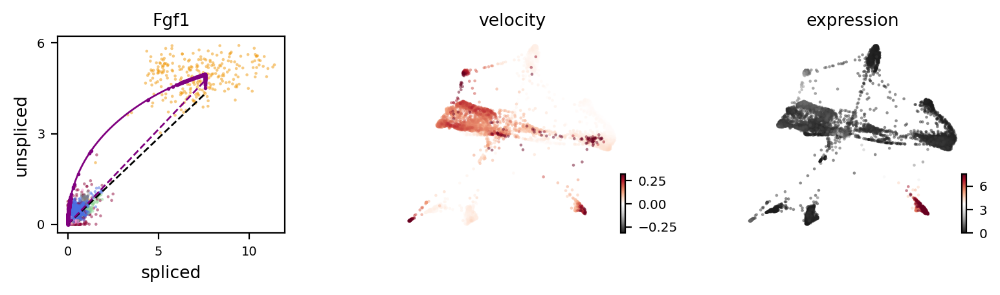

In [48]:
var_names0 = ['Fgf1']
scv.pl.velocity(Estrus_subset_analyzed_velo_dynamics, color='leiden_anno', basis='X_draw_graph_fa', 
                var_names=var_names0, colorbar=True, color_map='RdGy_r',
               save='_Fig 5_Estrus_subset_analyzed_velo_dynamics_VelocityPlot_FA_Fgf1.pdf')

saving figure to file ./figures/scvelo__Fig 5B_Estrus_subset_analyzed_velo_dynamics_VelocityPlot_FA_Leiden.png


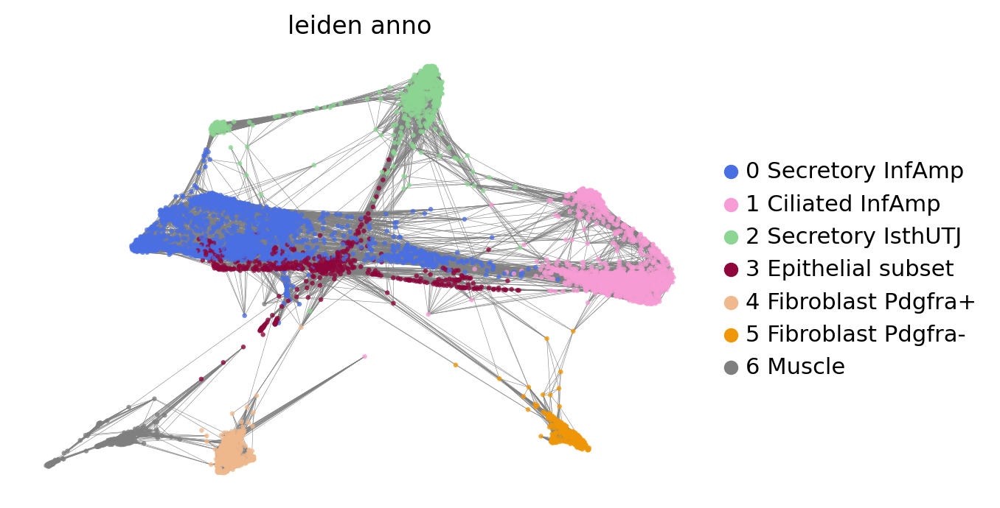

In [49]:
scv.pl.velocity_graph(Estrus_subset_analyzed_velo_dynamics, basis='X_draw_graph_fa',
                                 color=['leiden_anno'],
                                 frameon=False, legend_loc='right margin', 
                     save='_Fig 5B_Estrus_subset_analyzed_velo_dynamics_VelocityPlot_FA_Leiden.png')

In [50]:
Estrus_subset_analyzed_velo_dynamics

AnnData object with n_obs × n_vars = 5156 × 9490
    obs: 'Clusters', '_X', '_Y', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'leiden_anno', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'fit_r2'
    uns: "dendrogram_['leiden']", 'dendrogram_leiden', 'draw_graph', 'hvg', 'leiden', 'leiden_anno_colors', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'rank_velocity_genes', 'recover_dynamics', 'umap', 'velocity_g

saving figure to file ./figures/scvelo_heatmap__Estrus_subset_analyzed_velo_dynamics_heatmap.png


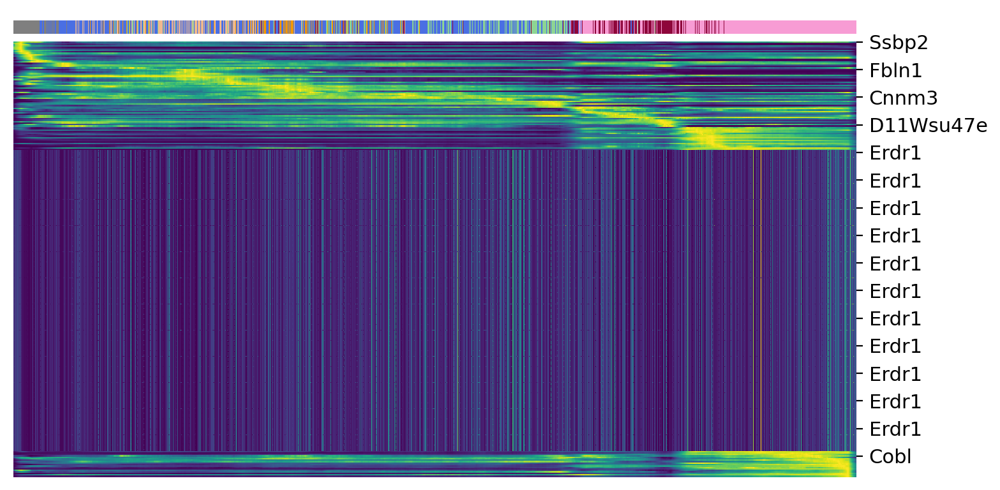

In [51]:
top_genesd = Estrus_subset_analyzed_velo_dynamics.var_names[Estrus_subset_analyzed_velo_dynamics.var.fit_likelihood.argsort()[::-1]][:300]
scv.pl.heatmap(Estrus_subset_analyzed_velo_dynamics, var_names=top_genesd, tkey='latent_time',
               n_convolve=100, col_color='leiden_anno',
               save='_Estrus_subset_analyzed_velo_dynamics_heatmap.png')

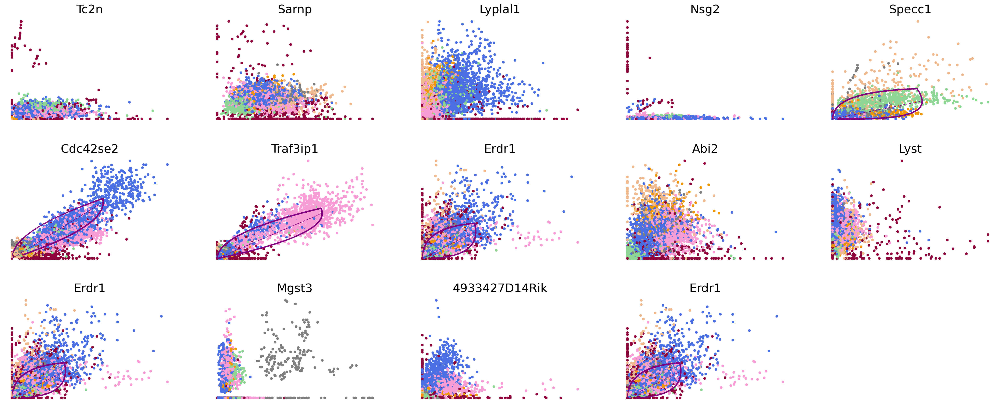

In [52]:
scv.pl.scatter(Estrus_subset_analyzed_velo_dynamics, basis=top_genesd[:20], legend_loc='none', color='leiden_anno',
               size=80, frameon=False, ncols=5, fontsize=20)

In [53]:
scv.tl.rank_velocity_genes(Estrus_subset_analyzed_velo_dynamics, n_genes=5000, resolution=0.1,
                           match_with='leiden_anno')

computing velocity clusters
    finished (0:00:00) --> added 
    'velocity_clusters', clusters based on louvain modularity on velocity vector field (adata.obs)
ranking velocity genes
    finished (0:00:01) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [54]:
pd.DataFrame(Estrus_subset_analyzed_velo_dynamics.uns['rank_velocity_genes']['names']).head(500)

,6 Muscle (1),6 Muscle (2),4 Fibroblast Pdgfra+ (1),5 Fibroblast Pdgfra- (1),2 Secretory_IsthUTJ (1),1 Ciliated_InfAmp (1),1 Ciliated_InfAmp (2),3 Epithelial_subset (1),0 Secretory_InfAmp (1)
0,Reep1,Adam19,Meg3,Muc16,Naip5,Dnah6,Fndc1,Fxyd4,Mpzl1
1,Gas6,Jph2,Cped1,Bmp4,Gna14,Dnah9,AU022754,Kif27,Pgm2l1
2,Fgfr1,Bmp1,Fbn2,Lrp2,Hk2,Cfap44,Gm7173,Pgr,Lsr
3,Cnn2,Reep1,Col4a3,Fstl1,Clca1,Hydin,Cdc14a,Arhgap29,Rin3
4,Adgra2,Moxd1,Cdh11,C1qtnf1,Rasgef1b,Dnah12,4833427G06Rik,Ccdc108,Gtf2f2
...,...,...,...,...,...,...,...,...,...
495,Irgm2,Sntb2,Trpv6,Acsl4,Col6a2,AU020206,Dhrs3,Trim7,Lin7a
496,Cotl1,Nrip1,Smox,Cfap69,Cdkl1,AW551984,Col14a1,Dnaaf2,Grem2
497,Gm20442,Col4a2,Tmem53,Chaf1a,Pde7a,Pik3r1,Fgf7,Ostm1,Gypc
498,Hmcn2,Atp2b2,Fbxo36,Ccdc40,Pkia,Cald1,Iigp1,RP23-378D16.5,Podxl


In [55]:
Estrus_subset_analyzed_velo_dynamics_Drivers = pd.DataFrame(Estrus_subset_analyzed_velo_dynamics.uns['rank_velocity_genes']['names'])

In [56]:
Estrus_subset_analyzed_velo_dynamics_Drivers.to_csv('./Table_Estrus_subset_analyzed_velo_dynamics_Drivers.csv')

To check driver genes in #0/Secretory_InfAmp Top5 and bottom5. Top genes are genes with positive velocities (upregulated genes). Bottom genes are genes with negative velocities (downregulated genes in that population).
* var_names0
* var_names1 ... var_namesn

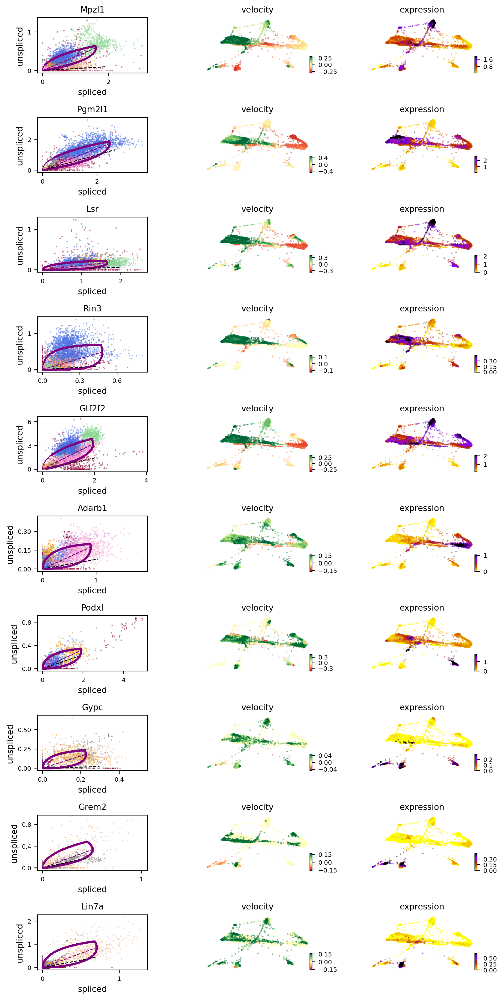

In [57]:
var_names0 = ['Mpzl1', 'Pgm2l1', 'Lsr', 'Rin3', 'Gtf2f2', 'Adarb1', 'Podxl', 'Gypc', 'Grem2', 'Lin7a']
scv.pl.velocity(Estrus_subset_analyzed_velo_dynamics, color='leiden_anno', basis='X_draw_graph_fa', 
                var_names=var_names0, colorbar=True)

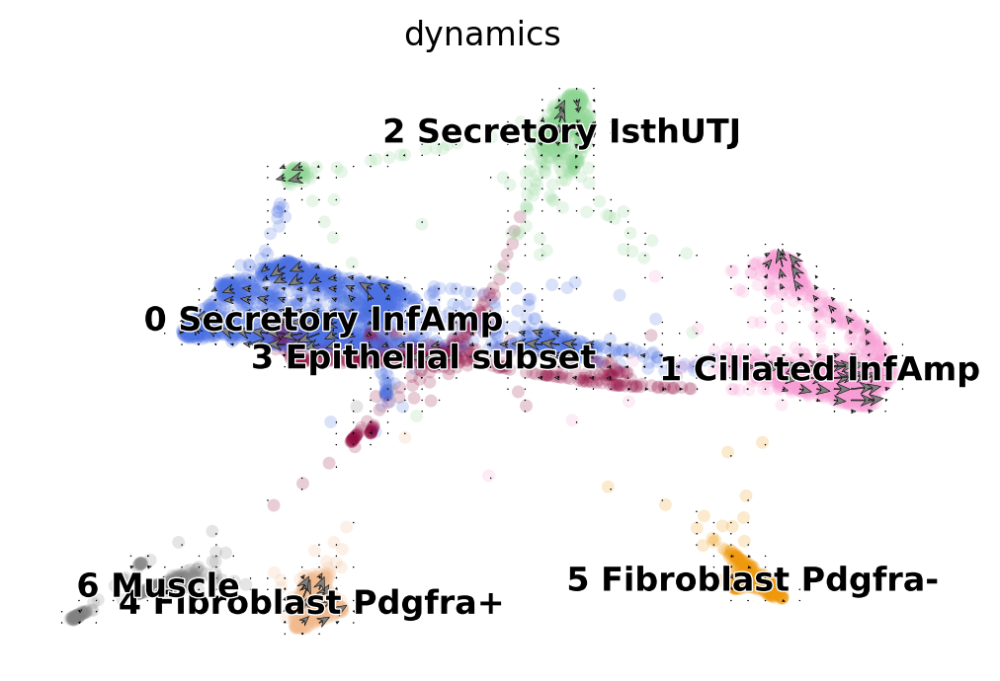

In [58]:
scv.pl.velocity_embedding_grid(Estrus_subset_analyzed_velo_dynamics, legend_loc='on data',
                               color='leiden_anno', basis='X_draw_graph_fa', 
                               layer=['velocity'], arrow_size=2.5, title='dynamics')

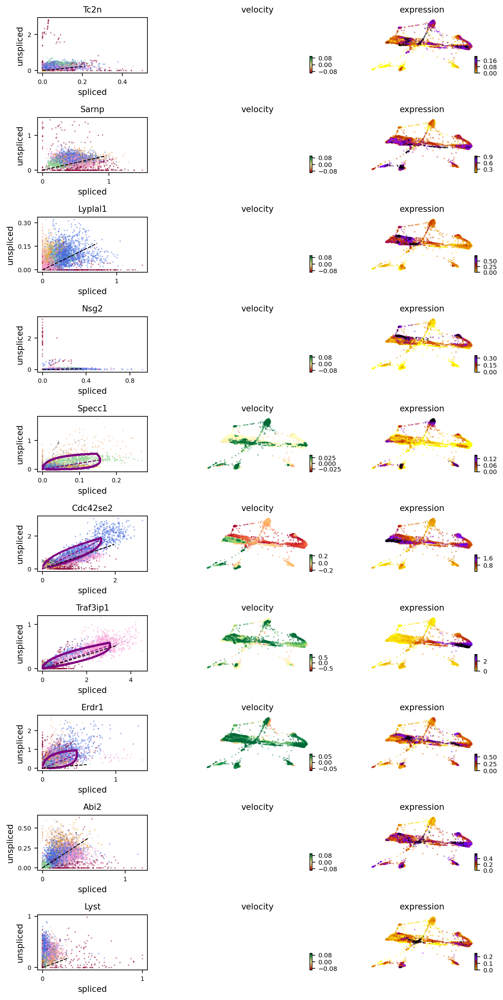

In [59]:
scv.pl.velocity(Estrus_subset_analyzed_velo_dynamics, basis='X_draw_graph_fa', color='leiden_anno',
                var_names=top_genesd[:10], colorbar=True)

In [60]:
Estrus_subset_analyzed_velo_dynamics.write('./Estrus_subset_analyzed_velo_dynamics.h5ad')

This is the command to load data after saving dataset.

In [61]:
Estrus_subset_analyzed_velo_dynamics = sc.read('./Estrus_subset_analyzed_velo_dynamics.h5ad')